> <div class="alert alert-block alert-secondary" style='font-size:18px'>
Customer behavior holds the key to unlocking successful marketing strategies and happier customers. This project utilizes KMeans clustering to segment our customer base based on their purchasing habits and overall value to the business.<br><br>This approach offers several advantages:<br><br><li><b>Targeted Marketing</b>: By understanding distinct customer segments, we can craft personalized marketing campaigns that resonate better, leading to improved engagement and conversion rates.</li><li><b>Enhanced Customer Satisfaction</b>: Tailoring our offerings and communication to specific customer needs fosters a more positive customer experience.</li><li><b>Data-Driven Decisions</b>: KMeans clustering provides a data-driven foundation for optimizing marketing efforts and resource allocation.</li>
</div>

## 1.0 Import Dependencies

In [ ]:
import os
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt


import seaborn as sns
from scipy import stats
import numpy as np
from sklearn.preprocessing import StandardScaler

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

## 2.0 Load Data

In [ ]:
df = pd.read_csv('/content/data.csv', encoding='latin1')
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


## 3.0 Data Understanding

### 3.1 Shape, Info, Describe

In [ ]:
df.shape

(541909, 8)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [ ]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


## 4.0 Data Preparation and Cleaning

### 4.1 Missing Values

In [ ]:
df_msn = pd.DataFrame(df.isna().sum())
df_msn['Features'] = df_msn.index
df_msn['MissingValues'] = df_msn[0]
fig = px.bar(df_msn,
            title='Missing Values by Features',
             x = 'Features',
             y = 'MissingValues',
             color='Features',
            text='MissingValues',
            text_auto='.2s')
fig.update_yaxes(title='Count of Missing Values')

In [ ]:
customer_msn = (df['CustomerID'].isna().sum() / len(df['CustomerID'])) * 100
description_msn = (df['Description'].isna().sum() / len(df['CustomerID'])) * 100
print('{:.2f}%, {:.2f}%'.format(customer_msn,description_msn))

24.93%, 0.27%


> <div class="alert alert-block alert-secondary">
    <span style='font-size:18px'><li>Approximately 140k transactions have missing Customer data. That is 24.93% of all Customer data. </li></span>
<span style='font-size:18px'><li>1.5k items have missing descriptions. That is 0.27%.</li></span></div>

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
I will proceed to remove missing values and any other data point not required for this analysis
</div>

In [ ]:
df.drop(df[df['CustomerID'].isna() | df['Description'].isna()].index, inplace=True)

In [ ]:
df.drop(df.query('Quantity < 0').index, inplace=True)

In [ ]:
df.drop(df.query('Country == "Unspecified"').index, inplace=True)

In [ ]:
df.drop(df.query('Description in ["POSTAGE", "CARRIAGE", "Discount", "DOTCOM POSTAGE", "CRUK Commission", "Manual"]').index, axis=0, inplace=True)

### 4.2 Datatype issues

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
    I will convert the <b>InvoiceDate</b> and <b>CustomerID</b> to the appropraite datatypes
</div>

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

In [ ]:
df['CustomerID'] = df['CustomerID'].astype('int')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 396142 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    396142 non-null  object        
 1   StockCode    396142 non-null  object        
 2   Description  396142 non-null  object        
 3   Quantity     396142 non-null  int64         
 4   InvoiceDate  396142 non-null  datetime64[ns]
 5   UnitPrice    396142 non-null  float64       
 6   CustomerID   396142 non-null  int64         
 7   Country      396142 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 27.2+ MB


In [ ]:
df.describe()

,Quantity,InvoiceDate,UnitPrice,CustomerID
count,396142.000000,396142,396142.000000,396142.000000
mean,13.049507,2011-07-11 00:09:54.120290304,2.868079,15302.566395
min,1.000000,2010-12-01 08:26:00,0.000000,12346.000000
25%,2.000000,2011-04-07 10:43:00,1.250000,13975.000000
50%,6.000000,2011-07-31 15:00:00,1.950000,15159.000000
75%,12.000000,2011-10-20 15:15:00,3.750000,16804.000000
max,80995.000000,2011-12-09 12:50:00,649.500000,18287.000000
std,180.785427,NaN,4.265471,1709.631177


## 5.0 Processing Data for Segmentation

> <div class="alert alert-block alert-secondary">
    <span style='font-size:18px'>
    The features in this dataset that tells us about customer buying behavior include <b>Quantity</b>, <b>InvoiceDate</b>, and <b>UnitPrice</b>. <br /><br />
    We are going to derive a customer's RFM ( Recency, Frequency, Monetary ) value using these variables.
    </span></div>

### 5.1 Recency

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
The following codes will do the following:<br><br>
    <li>Keep only the most recent date of purchase</li>
    <li>Assign a recency score to each customer based on their last purchase date</li>
</div>

In [ ]:
df['Rank'] = df.sort_values(['CustomerID','InvoiceDate']).groupby(['CustomerID'])['InvoiceDate'].rank(method='min').astype(int)
recent_df = df[df['Rank']==1]

In [ ]:
earliest_purchase = pd.to_datetime(min(recent_df['InvoiceDate']))
recent_df['Recency'] = (recent_df['InvoiceDate'] - earliest_purchase).dt.days

<ipython-input-50-b57fdf6d09e3>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
recent_df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Rank,Recency
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,1,0
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,1,0
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,0
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,1,0


> <div class="alert alert-block alert-secondary" style='font-size:18px'>
 The dataframe now has a Recency column which tells us the last time a customer made a purchase on the platform
</div>

### 5.2 Frequency

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
Now we calculate how many times each customer has made a purchase on the platform
</div>

In [ ]:
freq = recent_df.groupby('CustomerID')['InvoiceDate'].count()
freq_df = pd.DataFrame(freq).reset_index()
freq_df.columns = ['CustomerID', 'Frequency']
freq_df.head()

,CustomerID,Frequency
0,12346,1
1,12347,31
2,12348,16
3,12349,72
4,12350,16


> <div class="alert alert-block alert-secondary" style='font-size:18px'>
Merging both dataframes
</div>

In [ ]:
rec_freq = freq_df.merge(recent_df, on= 'CustomerID')
rec_freq.head()

,CustomerID,Frequency,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,Country,Rank,Recency
0,12346,1,541431,23166,MEDIUM CERAMIC TOP STORAGE JAR,74215,2011-01-18 10:01:00,1.04,United Kingdom,1,48
1,12347,31,537626,85116,BLACK CANDELABRA T-LIGHT HOLDER,12,2010-12-07 14:57:00,2.10,Iceland,1,6
2,12347,31,537626,22375,AIRLINE BAG VINTAGE JET SET BROWN,4,2010-12-07 14:57:00,4.25,Iceland,1,6
3,12347,31,537626,71477,COLOUR GLASS. STAR T-LIGHT HOLDER,12,2010-12-07 14:57:00,3.25,Iceland,1,6
4,12347,31,537626,22492,MINI PAINT SET VINTAGE,36,2010-12-07 14:57:00,0.65,Iceland,1,6


### 5.3 Monetary Value

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
Now we calculate each user's monetary value to understand the total amount they have spent on the platform
</div>

In [ ]:
rec_freq['Total'] = rec_freq['Quantity'] * rec_freq['UnitPrice']
m = rec_freq.groupby('CustomerID')['Total'].sum()
m = pd.DataFrame(m).reset_index()
m.columns = ['CustomerID', 'MonetaryValue']
m.head()

,CustomerID,MonetaryValue
0,12346,77183.60
1,12347,711.79
2,12348,652.80
3,12349,1457.55
4,12350,294.40


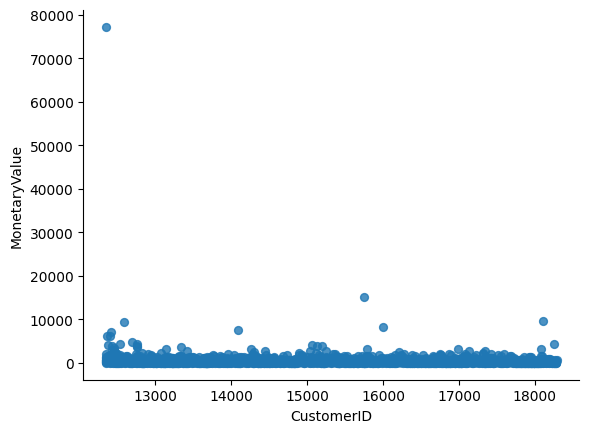

In [ ]:
# @title CustomerID vs MonetaryValue

from matplotlib import pyplot as plt
m.plot(kind='scatter', x='CustomerID', y='MonetaryValue', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
Now let's merge this dataframe which contains each customer's monetary value to the main dataframe. <br><br>
    Then we create a subset of the values required for segmentation
</div>

In [ ]:
rfm = m.merge(rec_freq, on='CustomerID')
final_df = rfm[['CustomerID', 'Recency', 'Frequency', 'MonetaryValue']]
final_df.head()

,CustomerID,Recency,Frequency,MonetaryValue
0,12346,48,1,77183.60
1,12347,6,31,711.79
2,12347,6,31,711.79
3,12347,6,31,711.79
4,12347,6,31,711.79


from matplotlib import pyplot as plt
_df_0['CustomerID'].plot(kind='hist', bins=20, title='CustomerID')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Recency'].plot(kind='hist', bins=20, title='Recency')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['Frequency'].plot(kind='hist', bins=20, title='Frequency')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['MonetaryValue'].plot(kind='hist', bins=20, title='MonetaryValue')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='CustomerID', y='Recency', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='Recency', y='Frequency', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='Frequency', y='MonetaryValue', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['CustomerID']
  ys = series['Recency']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_7.sort_values('CustomerID', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('CustomerID')
_ = plt.ylabel('Recency')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['CustomerID']
  ys = series['MonetaryValue']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('CustomerID', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('CustomerID')
_ = plt.ylabel('MonetaryValue')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['CustomerID']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'CustomerID'}, axis=1)
              .sort_values('CustomerID', ascending=True))
  xs = counted['CustomerID']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('CustomerID', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('CustomerID')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Frequency']
  ys = series['Recency']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('Frequency', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Frequency')
_ = plt.ylabel('Recency')

from matplotlib import pyplot as plt
_df_11['CustomerID'].plot(kind='line', figsize=(8, 4), title='CustomerID')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_12['Recency'].plot(kind='line', figsize=(8, 4), title='Recency')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_13['Frequency'].plot(kind='line', figsize=(8, 4), title='Frequency')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['MonetaryValue'].plot(kind='line', figsize=(8, 4), title='MonetaryValue')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
from matplotlib import pyplot as plt
_df_13['Frequency'].plot(kind='line', figsize=(8, 4), title='Frequency')
plt.gca().spines[['top', 'right']].set_visible(False)

### 5.4 Removing Outliers

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
Now I have the meaning features needed to build a segmentation model. To further process the data, I need to check for outliers and remove them. <br><br>
    To get a visual representation of outliers, I will be using a boxplot
</div>

In [ ]:
features  = ['Recency', 'Frequency', 'MonetaryValue']

for i in features:
    print(str(i)+': ')
    fig = px.box(final_df,
                x = final_df[i])
    fig.show()

Recency: 


Frequency: 


MonetaryValue: 


> <div class="alert alert-block alert-secondary" style='font-size:18px'>
From these plots, Recency is the only variable with no visible outliers. Frequency and monetary value have many outliers that must be removed. <br><br>
    I will be removing every data point with a Z-Score >= 3. The reason for this number is because values that are 3 standard deviations from the mean in a normal distribution are usually rare and a likely to be outliers.
</div>

In [ ]:
new_df = final_df[['Recency', 'Frequency', 'MonetaryValue']]
z_scores = stats.zscore(new_df)
abs_z_scores = np.abs(z_scores)
abs_z_scores.head()

,Recency,Frequency,MonetaryValue
0,0.936717,1.156793,100.268876
1,1.282132,0.408995,0.157183
2,1.282132,0.408995,0.157183
3,1.282132,0.408995,0.157183
4,1.282132,0.408995,0.157183


In [ ]:
filtered_entries = (abs_z_scores < 3).all(axis=1)
new_df = new_df[filtered_entries]
new_df.head()

,Recency,Frequency,MonetaryValue
1,6,31,711.79
2,6,31,711.79
3,6,31,711.79
4,6,31,711.79
5,6,31,711.79


### 5.5 Standardization

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
The final pre-processing technique is standardization
</div>

In [ ]:
new_df = new_df.drop_duplicates()
col_names = ['Recency', 'Frequency', 'MonetaryValue']
features = new_df[col_names]
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)
scaled = pd.DataFrame(features, columns = col_names)

scaled.head()

,Recency,Frequency,MonetaryValue
0,-1.222734,0.347523,1.013043
1,-1.146326,-0.340100,0.837127
2,1.740215,2.227025,3.236994
3,-0.738814,-0.340100,-0.231667
4,-0.619957,-0.385941,-0.225405


### 5.6 PCA

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
To help reduce noise and highlight the most important features.
</div>

In [ ]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(scaled)

## 6.0 Building The Customer Segmentation Model

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
I will be using K-Means clustering to peform customer segmentation. <br><br>
To determine the number of segments needed, I will be using the elbow method
</div>

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
Convert the result into a dataframe and visualise
</div>

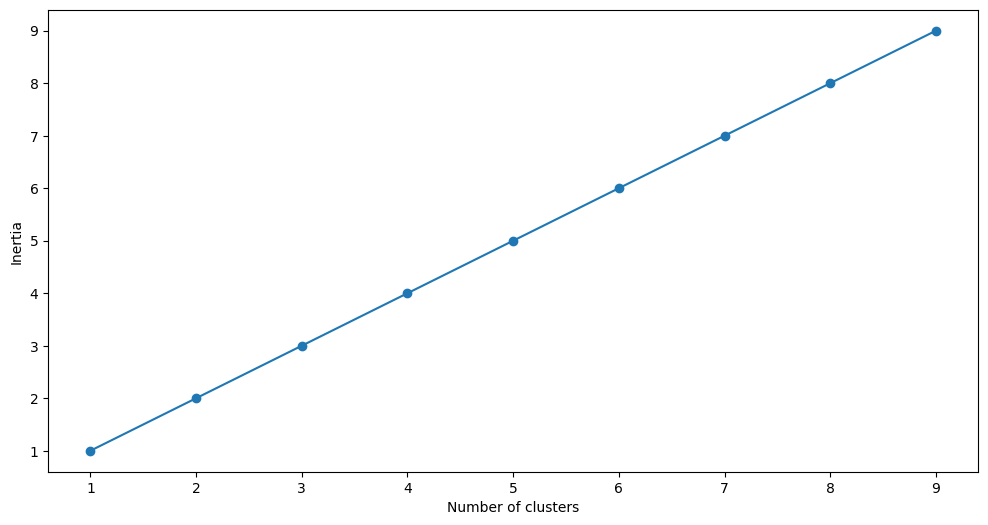

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt

# Create a sample DataFrame
SSE = [1, 2, 3, 4, 5, 6, 7, 8, 9]  # Replace with your actual SSE values
frame = pd.DataFrame({'Cluster':range(1,10), 'SSE':SSE})

# Create the plot
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['SSE'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
The point of inflection on this curve is at the 3-cluster mark, which means the optimal number of clusters to use in the algorithm is 3 <br><br>Now, I'll build the model with 3 clusters
</div>

In [ ]:
kmeans = KMeans( n_clusters = 3, init='k-means++')
kmeans.fit(X_pca)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=3)

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
I will be using the silhouette score to evaluate the performance of this model.
</div>

In [ ]:
print(silhouette_score(X_pca, kmeans.labels_, metric='euclidean'))

0.4587985303405028


> <div class="alert alert-block alert-secondary" style='font-size:18px'>
    The silhouette coefficient of this model is 0.46, indicating a reasonable cluster separation
</div>

## 7.0 Model Interpretation and Visusalisation

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
    I will assign clusters to each customer in the dataset
</div>

In [ ]:
pred = kmeans.predict(X_pca)
frame = pd.DataFrame(new_df)
frame['Cluster'] = pred
frame.head()

,Recency,Frequency,MonetaryValue,Cluster
1,6,31,711.79,1
32,15,16,652.80,1
48,355,72,1457.55,2
120,63,16,294.40,1
136,77,15,296.50,1


In [ ]:
from matplotlib import pyplot as plt
_df_0['Recency'].plot(kind='hist', bins=20, title='Recency')
plt.gca().spines[['top', 'right',]].set_visible(False)

NameError: name '_df_0' is not defined

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
    I will use a bar plot to identify the distinct traits of the customers
</div>

In [ ]:
mean_df = frame.groupby(['Cluster'], as_index=False).mean()
for i in col_names:
    print(i)
    fig = px.bar(mean_df,
                x='Cluster',
                y=str(i))
    fig.show()

> <table class="alert alert-block alert-secondary" style='font-size:18px'>
    <tr>
    <th>Cluster</th>
    <th>Customer Attributes</th>
    </tr>
    <tr>
        <td>0</td>
        <td><b>Low-Activity, Occasional Buyers</b><br>
        Customers in this segment have low recency, frequency, and monetary value scores. These are people who make occasional purchases and haven't engaged recently.</td>
    </tr>    
    <tr>
        <td>1</td>
        <td><b>High-Value, High-Frequency Customers</b><br>
            Customers in this segment have moderate recency but high frequency, and monetary value scores, indicating they are high-value, frequent purchasers.</td>
    </tr>    
    <tr>
        <td>2</td>
        <td><b>Low-Engagement, Moderate Spenders</b><br>
        Customers in this segment demonstrate high recency but low frequency and monetary value scores. They might make purchases infrequently but have engaged recently.</td>
    </tr></table>

## 8.0 Recommendations

> <div class="alert alert-block alert-secondary" style='font-size:18px'>
    <b>For Cluster 0: Low-Activity, Occasional Buyers</b><br/><br>
    <li><b>Promotional Offers</b>: Offer moderate discounts or promotions to encourage continued purchasing behavior.</li>
    <li><b>Loyalty Programs</b>: Implement a loyalty program with rewards for frequent purchases to increase engagement.</li>
    <li><b>Personalized Recommendations</b>: Use data-driven product recommendations to suggest complementary products and increase average transaction value.</li><br><br>
    <b>For Cluster 1: High-Value, High-Frequency Customers</b><br/><br/>
    <li><b>Exclusive Rewards</b>: Develop exclusive rewards and benefits for this high-value segment, such as VIP memberships or early access to new products.</li>
    <li><b>Re-engagement Campaigns</b>: Initiate re-engagement campaigns with personalized offers or reminders due to their higher recency score.</li>
    <li><b>Premium Services</b>: Offer premium services like free shipping, dedicated customer support, or personalized shopping experiences to maintain their loyalty.</li><br><br>
    <b>For Cluster 2: Low-Engagement, Moderate Spenders</b><br/><br/>
    <li><b>Reactivation Campaigns</b>: Implement reactivation campaigns with special offers or discounts tailored to their past purchasing behavior.</li>
    <li><b>Customer Feedback</b>: Conduct surveys to understand why they have become less engaged and address any identified issues.</li>
    <li><b>Content Marketing</b>: Utilize content marketing strategies like informative blogs, newsletters, or social media engagement to bring them back to active purchasing. </li>
</div>